In [105]:
import pulp
import random
import numpy as np
import matplotlib.pyplot as plt
import pickle
import tqdm

In [2]:
# -------------------
# No Capacity Sharing
# -------------------
def no_capacity_sharing(verbose=False, plot=False, demand=None, simulation_params=None):
    """"""
    D = demand
    r = simulation_params["r"]
    alpha = simulation_params["alpha"]
    N = simulation_params["N"]
    C = simulation_params["C"]

    prob = pulp.LpProblem("Satellite_Capacity_Allocation", pulp.LpMaximize)

    # Define decision variables x_i
    x = [pulp.LpVariable(f"x_{i}", lowBound=0) for i in range(N)]

    # Define objective function
    objective = pulp.lpSum((r + alpha)*x[i] for i in range(N)) - alpha*sum(D)
    prob += objective

    # Add constraints
    for i in range(N):
        prob += x[i] <= D[i], f"Demand_Satisfaction_{i}"

    for i in range(N):
        prob += x[i] <= C, f"Capacity_Constraint_{i}"

    prob.solve()

    if verbose:
        # Display the status of the solution
        print(f"Status: {pulp.LpStatus[prob.status]}")

        # Display the optimized values of x_i
        print("\nOptimized demand satisfaction in each region:")
        for i in range(N):
            print(f"Region {i+1}: Satisfied Demand = {x[i].varValue:.2f} units, Demand = {D[i]:.2f} units")

    # Calculate the total profit
    total_revenue = r * sum(x[i].varValue for i in range(N))
    total_penalty = alpha * sum(max(D[i] - x[i].varValue, 0) for i in range(N))
    total_profit = total_revenue - total_penalty

    return {"revenue":total_revenue, "penalty":total_penalty, "profit":total_profit}


In [3]:
# ---------------------
# With Capacity Sharing
# ---------------------
def with_capacity_sharing(verbose=False, plot=False, demand=None, simulation_params=None):
    """"""
    D = demand
    r = simulation_params["r"]
    alpha = simulation_params["alpha"]
    N = simulation_params["N"]
    C = simulation_params["C"]

    prob = pulp.LpProblem("Satellite_Capacity_Sharing", pulp.LpMaximize)

    # Define decision variables x_i
    x = [pulp.LpVariable(f"x_{i}", lowBound=0) for i in range(N)]

    # Define objective function
    objective = pulp.lpSum((r + alpha) * x[i] for i in range(N)) - alpha * sum(D)
    prob += objective

    # Add constraints
    for i in range(N):
        prob += x[i] <= D[i], f"Demand_Satisfaction_{i}"

    # Total capacity constraint (shared capacity)
    prob += pulp.lpSum(x) <= N * C, "Total_Capacity_Constraint"

    # Solve the LP problem
    prob.solve()

    if verbose:
        # Display the status of the solution
        print(f"Status: {pulp.LpStatus[prob.status]}")

        # Display the optimized values of x_i
        print("\nOptimized demand satisfaction in each region:")
        for i in range(N):
            print(f"Region {i+1}: Satisfied Demand = {x[i].varValue:.2f} units, Demand = {D[i]:.2f} units")

    # Calculate the total profit
    total_revenue = r * sum(x[i].varValue for i in range(N))
    total_penalty = alpha * sum(max(D[i] - x[i].varValue, 0) for i in range(N))
    total_profit = total_revenue - total_penalty

    return {"revenue":total_revenue, "penalty":total_penalty, "profit":total_profit}

In [4]:
def generate_demand_matrix(N, mean, sigmas, trials, use_binomial=False, random_seed=0):
    # Set seeds for reproducibility
    # random.seed(random_seed)
    # np.random.seed(random_seed)

    if use_binomial:
        # Compute threshold using 'mean' (not undefined mean_demand)
        threshold = mean * (1 / N) * ((1 - 1 / N) ** (N - 1))
        print("Threshold:", threshold)

        # For each trial, simulate N Bernoulli experiments and count successes.
        # We generate trials * N random floats and reshape into a (trials, N) array.
        random_floats = np.random.rand(trials * N)
        thresholded_values = np.where(random_floats < threshold, 1.0, 0.0)
        reshaped_values = thresholded_values.reshape(trials, N)
        # Sum each row (each trial) to get the binomial outcome.
        binomial_demands = reshaped_values.sum(axis=1)

        # Replicate the same binomial results for each spread
        demand_matrix = np.array([binomial_demands for _ in spreads])
    else:
        # Generate a demand matrix with uniformly distributed values.
        # The result has shape: (len(spreads), trials, N)
        demand_matrix = np.array([
            [
                # [random.uniform(mean - spread, mean + spread) for _ in range(N)]
                [np.random.gamma(mean**2/sigma**2, (sigma**2)/mean) for _ in range(N)]
                for _ in range(trials)
            ]
            for sigma in sigmas
        ])

    return demand_matrix

In [115]:
def run_experiment(simulation_params, spreads=[], means=[], trials=0, enable_sharing=False):
  all_profits = []
  all_penalties = []
  all_revenues = []

  random.seed(simulation_params["random_seed"])
  np.random.seed(simulation_params["random_seed"])

  for mean in means:
    demand_matrix = generate_demand_matrix(simulation_params["N"], mean, spreads, trials, use_binomial=False, random_seed=simulation_params["random_seed"])
    # print("mean", mean)
    # print("demand_matrix")
    # print(demand_matrix)
    # print("-------")
    flattened_demand_matrix = []
    for elt in demand_matrix[0][0]:
        flattened_demand_matrix.append(float(elt))
    # print("flattened_demand_matrix", flattened_demand_matrix)
    
    mean_profits = []
    mean_penalties = []
    mean_revenues = []
    for spread_idx in range(len(spreads)):
      profits = []
      penalties = []
      revenues = []
      for trial_idx in range(trials):
        demand = demand_matrix[spread_idx, trial_idx]
        # print("spread", spreads[spread_idx], ":", demand)
        if enable_sharing:
          result = with_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)
        else:
          result = no_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)
        profits.append(result["profit"])
        penalties.append(result["penalty"])
        revenues.append(result["revenue"])
      mean_profits.append(np.mean(profits)) # TODO: consider saving the std. dev. as well?
      mean_penalties.append(np.mean(penalties))
      mean_revenues.append(np.mean(revenues))
    all_profits.append(mean_profits)
    all_penalties.append(mean_penalties)
    all_revenues.append(mean_revenues)

  return all_profits, all_penalties, all_revenues


def plot_experiment(experiment_1, experiment_2, espreads, means):
  """
    params:
      experiment_1: the baseline
      experiment_2: the experiment to compare to the baseline

    notes:
      assuming same set of spreads and means for both experiments

  """
  pass


In [6]:
def run_experiment_simple(simulation_params, demand_matrix, enable_sharing=False):
    all_profits = []
    all_penalties = []
    all_revenues = []

    for trial_idx in range(len(demand_matrix)):
        demand = demand_matrix[trial_idx]

        if enable_sharing:
            result = with_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)
        else:
            result = no_capacity_sharing(verbose=False, plot=False, demand=demand, simulation_params=simulation_params)

        all_profits.append(result["profit"])
        all_penalties.append(result["penalty"])
        all_revenues.append(result["revenue"])
        
    return {"all_profits":all_profits, "all_penalties":all_penalties, "all_revenues":all_revenues}

def save_experiment(result, sys_path, label, suffix):
   with open(sys_path + "oneshot_" + label + suffix, "wb") as f:
        pickle.dump(result, f)
   

def plot_experiment_simple(result):
  """
    params:
      experiment_1: the baseline
      experiment_2: the experiment to compare to the baseline

    notes:
      assuming same set of spreads and means for both experiments

  """
  all_profits = result["all_profits"]
  all_penalties = result["all_penalties"]
  all_revenues = result["all_revenues"]

  print("mean profit:", np.mean(np.array(all_profits)))
  print("max profits:", np.max(np.array(all_profits)))
  print("min profits:", np.min(np.array(all_profits)))

  plt.title(f"Distribution of profits, mean={np.mean(np.array(all_profits))}")
  plt.hist(all_profits, bins=10)
  plt.show()

  plt.title(f"Distribution of penalties, mean={np.mean(np.array(all_penalties))}")
  plt.hist(all_penalties, bins=10)
  plt.show()

  plt.title(f"Distribution of revenues, mean={np.mean(np.array(all_revenues))}")
  plt.hist(all_revenues, bins=10)
  plt.show()

def load_demand_matrix(fp):
  with open(fp, "rb") as f:
      return pickle.load(f)
  

Generate an upper bounds for three stage algorithm

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/brianli/Desktop/MEng/meng_venv/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/1414344db29b4ded985650ae114507c1-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/1414344db29b4ded985650ae114507c1-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 31 COLUMNS
At line 107 RHS
At line 134 BOUNDS
At line 135 ENDATA
Problem MODEL has 26 rows, 25 columns and 50 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Presolve 0 (-26) rows, 0 (-25) columns and 0 (-50) elements
Empty problem - 0 rows, 0 columns and 0 elements
Optimal - objective value 577910
After Postsolve, objective 577910, infeasibilities - dual 0 (0), primal 0 (0)
Optimal objective 577910 - 0 iterations time 0.002, Presolve 0.00
Option 

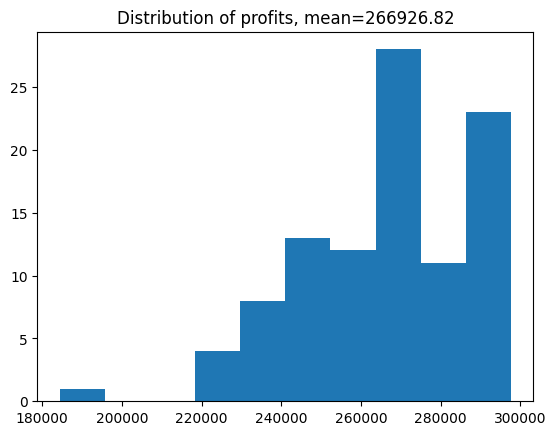

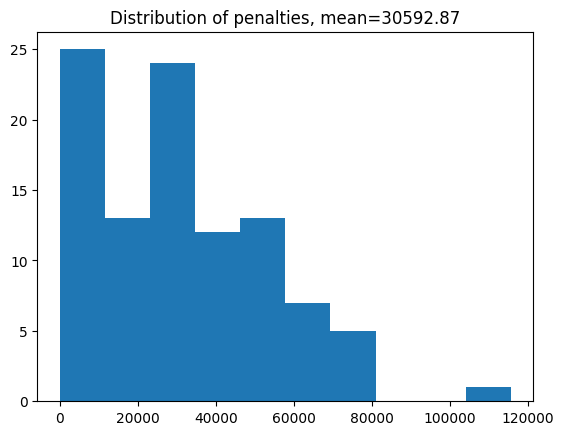

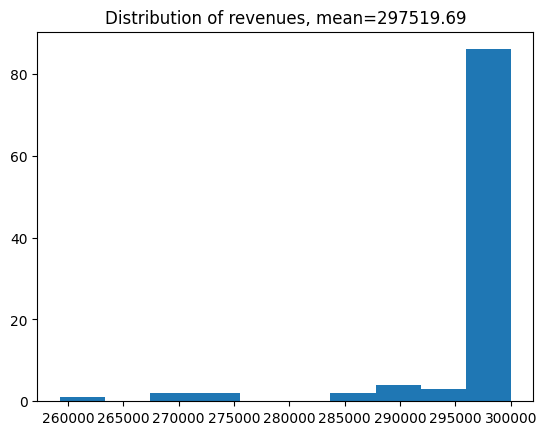

Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/brianli/Desktop/MEng/meng_venv/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/941a37d247214b0e8a7b114bfbcd44aa-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/941a37d247214b0e8a7b114bfbcd44aa-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 31 COLUMNS
At line 107 RHS
At line 134 BOUNDS
At line 135 ENDATA
Problem MODEL has 26 rows, 25 columns and 50 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Presolve 0 (-26) rows, 0 (-25) columns and 0 (-50) elements
Empty problem - 0 rows, 0 columns and 0 elements
Optimal - objective value 600000
After Postsolve, objective 600000, infeasibilities - dual 0 (0), primal 0 (0)
Optimal objective 600000 - 0 iterations time 0.002, Presolve 0.00
Option 

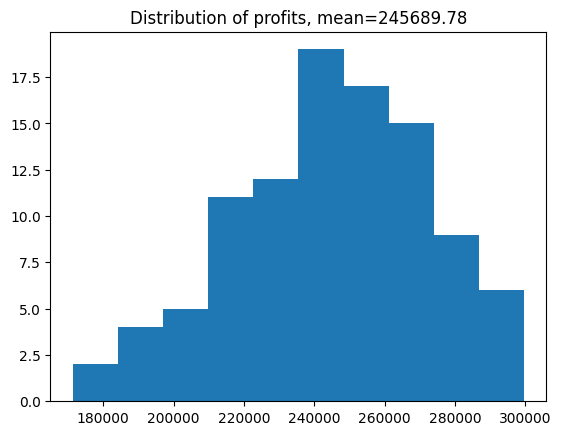

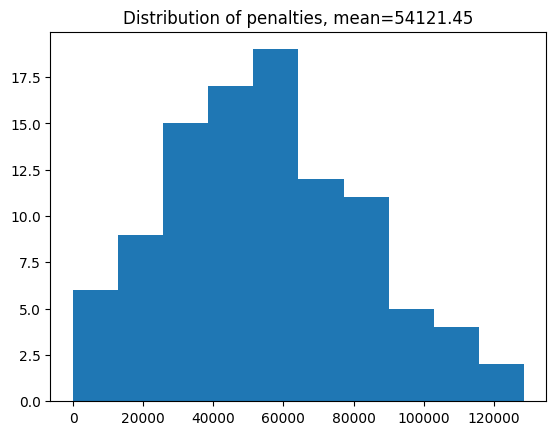

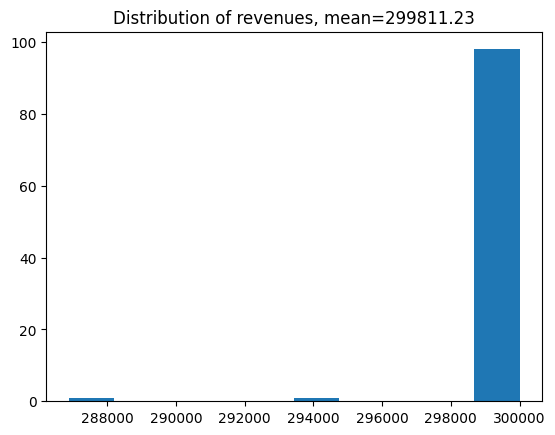

In [33]:
simulation_params = {
    "N": 25,
    "C": 480*25,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 42,
}

fp = "/Users/brianli/Desktop/MEng/leo_mac_sim/demand_matrix_0_0_500_uniform.pkl"
demand_matrix = load_demand_matrix(fp)



# labels = ["0_0_500_bipeak", "0_0_500_random", "0_0_500_uniform"]
# labels = ["300_80_500_", "200_80_500_", "100_80_500_"]
# labels = ["200_100_500_", "200_30_500_", "200_80_500_"]
# labels = ["200_10_500_"]
# labels = ["13000_1000_5_"]
# labels = ["12000_1000_5_", "12000_2000_5_", "12000_4000_5_"]
# labels = ["1000_400_5_", "2000_400_5_", "4000_400_5_", "6000_400_5_"]
# labels = ["1000_400_5_", "2000_400_5_", "4000_400_5_",  "6000_400_5_",  "8000_400_5_",  "10000_400_5_"]
# labels = ["1000_1000_5_", "2000_1000_5_", "4000_1000_5_",  "6000_1000_5_",  "8000_1000_5_", 
#           "10000_1000_5_", "11000_1000_5_", "12000_1000_5_", "14000_1000_5_"]
# labels = ["15000_1000_5_", "16000_1000_5_"]

# labels = ["6000_1000_100_", "8000_1000_100_", "10000_1000_100_", "12000_1000_100_",
#           "6000_3000_100_", "8000_3000_100_", "10000_3000_100_", "12000_3000_100_",
#           "6000_6000_100_", "8000_6000_100_", "10000_6000_100_", "12000_6000_100_"]

labels = ["13000_6000_100_", "14000_6000_100_"]

for label in labels:
    sys_path = "/Users/brianli/Desktop/MEng/leo_mac_sim/"
    suffix = ".pkl"

    demand_matrix = load_demand_matrix(sys_path + "demand_matrix_" + label + suffix)
    result = run_experiment_simple(simulation_params, demand_matrix, enable_sharing=True)
    save_experiment(result, sys_path, label, suffix)

    plot_experiment_simple(result)

    


Generate 4x2 matrix of plots

In [138]:
# spreads = [5, 10, 30, 60, 90, 120, 130, 150, 180, 210, 300] # standard deviations
# spreads = [5, 10, 30, 60, 90, 120]
# spreads = [5, 10, 15, 20, 25]
# means = [5, 10, 100, 300]
# means = [10, 50, 100, 300]

spreads = [1000, 2000, 3000, 4000, 5000, 6000]
# means = [6000, 8000, 10000, 12000, 14000]
means = [6000, 8000, 10000]
num_trials = 50

In [124]:
simulation_params = {
    "N": 25,
    "C": 480,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 0,
}
baseline = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=False)

print("Done 1")
simulation_params = {
    "N": 25,
    "C": 480,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 0,
}
sharing_only = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=True)


simulation_params = {
    "N": 25,
    "C": 480*25,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 0,
}
nulling_only = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=False)


simulation_params = {
    "N": 25,
    "C": 480*25,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 0,
}
sharing_and_nulling = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=num_trials,
               enable_sharing=True)



Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/brianli/Desktop/MEng/meng_venv/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/1fb10236038640bca429854251537000-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/1fb10236038640bca429854251537000-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 55 COLUMNS
At line 131 RHS
At line 182 BOUNDS
At line 183 ENDATA
Problem MODEL has 50 rows, 25 columns and 50 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Presolve 0 (-50) rows, 0 (-25) columns and 0 (-50) elements
Empty problem - 0 rows, 0 columns and 0 elements
Optimal - objective value 24000
After Postsolve, objective 24000, infeasibilities - dual 0 (0), primal 0 (0)
Optimal objective 24000 - 0 iterations time 0.002, Presolve 0.00
Option for

spreads [1, 1000, 4000, 6000]
means [400, 6000, 8000]
sigmas [1000, 2000, 3000, 4000, 5000, 6000]
Welcome to the CBC MILP Solver 
Version: 2.10.3 
Build Date: Dec 15 2019 

command line - /Users/brianli/Desktop/MEng/meng_venv/lib/python3.12/site-packages/pulp/solverdir/cbc/osx/64/cbc /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/fa39b21d841140a19e2bc1d670fa4132-pulp.mps -max -timeMode elapsed -branch -printingOptions all -solution /var/folders/ky/000bxhln13n825z8zq6flxp40000gn/T/fa39b21d841140a19e2bc1d670fa4132-pulp.sol (default strategy 1)
At line 2 NAME          MODEL
At line 3 ROWS
At line 55 COLUMNS
At line 131 RHS
At line 182 BOUNDS
At line 183 ENDATA
Problem MODEL has 50 rows, 25 columns and 50 elements
Coin0008I MODEL read with 0 errors
Option for timeMode changed from cpu to elapsed
Presolve 0 (-50) rows, 0 (-25) columns and 0 (-50) elements
Empty problem - 0 rows, 0 columns and 0 elements
Optimal - objective value 20009.657
After Postsolve, objective 20009.657, infeasibilit

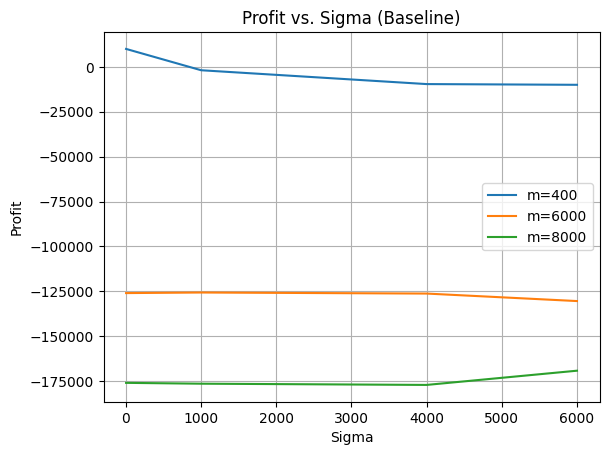

In [136]:
spreads = [1, 1000, 4000, 6000]
# means = [6000, 8000, 10000, 12000, 14000] # up to 12000, increasing mean increases profit. Past that, decreases profit due to increasing penalty
means = [400, 6000, 8000]
# num_trials = 50
print("spreads", spreads)
print("means", means)
print("sigmas", sigmas)
# saved to use for normalization
# no penalty and no nulling
simulation_params = {
    "N": 25,
    "C": 480,
    "r": 1,
    "alpha": 1,
    "beta": 1,
    "random_seed": 0,
}
baseline_for_normalization = run_experiment(simulation_params,
               spreads=spreads,
               means=means,
               trials=100,
               enable_sharing=False)

baseline_profits_nopenalty, baseline_penalties_nopenalty, baseline_revenues_nopenalty = baseline_for_normalization


for mean_idx in range(len(means)):
  gains = [
      baseline_profits_nopenalty[mean_idx][k] # use baseline m=1 for normalization
      # baseline_profits[mean_idx][k]
      for k in range(len(baseline_profits_nopenalty[0]))
  ]

  # Plot on the selected subplot
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")

plt.xlabel("Sigma")
plt.ylabel("Profit")
plt.title(f"Profit vs. Sigma (Baseline)")
plt.legend()
plt.grid()

In [125]:
baseline_profits, baseline_penalties, baseline_revenues = baseline
sharing_only_profits, sharing_only_penalties, sharing_only_revenues = sharing_only
nulling_only_profits, nulling_only_penalties, nulling_only_revenues = nulling_only
sharing_and_nulling_profits, sharing_and_nulling_penalties, sharing_and_nulling_revenues = sharing_and_nulling

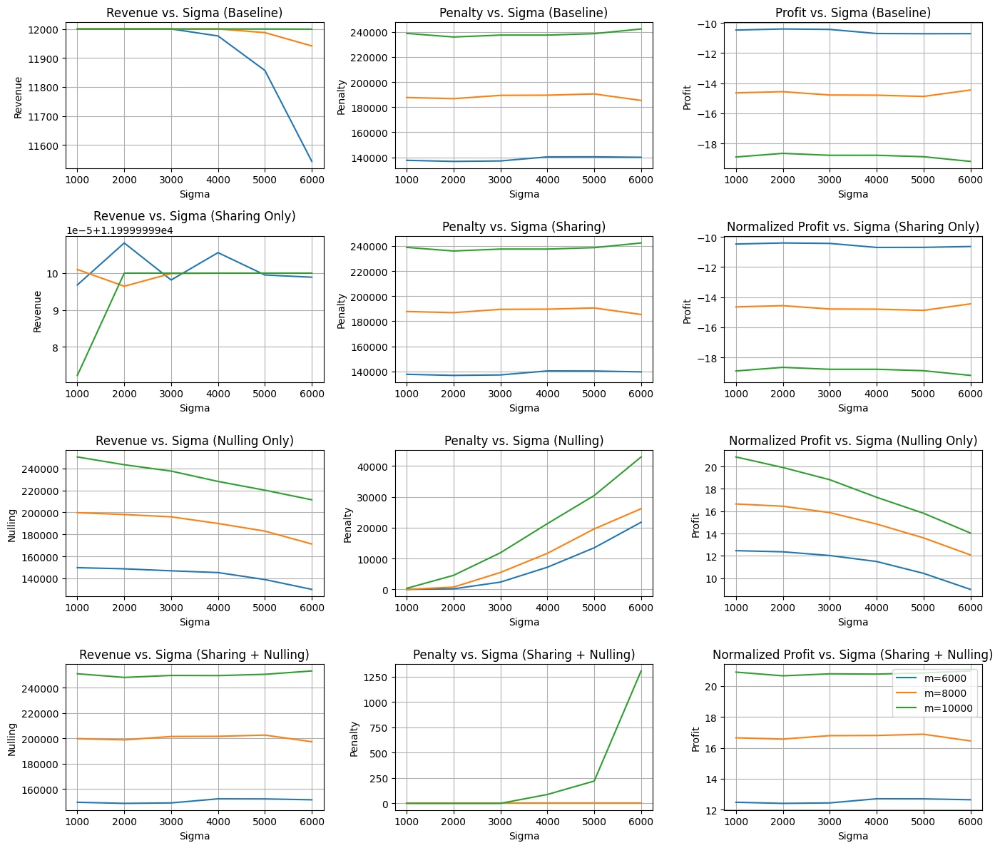

In [143]:
sigmas = spreads
NORMALIZATION_FACTOR = 12000
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(14, 12))  # Adjust figsize as needed

# Revenue vs. Sigma (Baseline)
ax = axes[0][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      baseline_revenues[mean_idx][k]
      for k in range(len(baseline_revenues[0]))
  ]


  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Revenue")
ax.set_title(f"Revenue vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Baseline)
ax = axes[0][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      baseline_penalties[mean_idx][k]
      for k in range(len(baseline_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Baseline)
ax = axes[0][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (baseline_profits[mean_idx][k]) / NORMALIZATION_FACTOR 
      # (baseline_profits[mean_idx][k]) / baseline_profits_nopenalty[0][0] # TODO: normalization? currently normalzied by baseline (no penalty), no sharing + no nulling
      # baseline_profits[mean_idx][k]
      for k in range(len(baseline_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Profit vs. Sigma (Baseline)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Sharing)
ax = axes[1][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_only_revenues[mean_idx][k]
      for k in range(len(sharing_only_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Revenue")
ax.set_title(f"Revenue vs. Sigma (Sharing Only)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Sharing)
ax = axes[1][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_only_penalties[mean_idx][k]
      for k in range(len(sharing_only_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Sharing)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Sharing)
ax = axes[1][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (sharing_only_profits[mean_idx][k] ) / NORMALIZATION_FACTOR 
      # (sharing_only_profits[mean_idx][k] ) / baseline_profits_nopenalty[0][0] # TODO: normalization?
      # (sharing_only_profits[mean_idx][k] )
      for k in range(len(sharing_only_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Sharing Only)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Nulling)
ax = axes[2][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      nulling_only_revenues[mean_idx][k]
      for k in range(len(nulling_only_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Nulling")
ax.set_title(f"Revenue vs. Sigma (Nulling Only)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Nulling)
ax = axes[2][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      nulling_only_penalties[mean_idx][k]
      for k in range(len(nulling_only_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Nulling)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Nulling)
ax = axes[2][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (nulling_only_profits[mean_idx][k]) / NORMALIZATION_FACTOR 
      # (nulling_only_profits[mean_idx][k]) / baseline_profits_nopenalty[0][0] # TODO: normalization?
      # (nulling_only_profits[mean_idx][k])
      for k in range(len(nulling_only_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Nulling Only)")
# ax.legend()
ax.grid()

# Revenue vs. Sigma (Sharing + Nulling)
ax = axes[3][0]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_and_nulling_revenues[mean_idx][k]
      for k in range(len(sharing_and_nulling_revenues[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Nulling")
ax.set_title(f"Revenue vs. Sigma (Sharing + Nulling)")
# ax.legend()
ax.grid()

# Penalty vs. Sigma (Sharing + Nulling)
ax = axes[3][1]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      sharing_and_nulling_penalties[mean_idx][k]
      for k in range(len(sharing_and_nulling_penalties[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Penalty")
ax.set_title(f"Penalty vs. Sigma (Sharing + Nulling)")
# ax.legend()
ax.grid()

# Profit vs. Sigma (Sharing + Nulling)
ax = axes[3][2]  # Access subplot at row i, column j

for mean_idx in range(len(means)):
  gains = [
      (sharing_and_nulling_profits[mean_idx][k]) / NORMALIZATION_FACTOR 
      # (sharing_and_nulling_profits[mean_idx][k]) / baseline_profits_nopenalty[0][0] # TODO: normalization?
      # (sharing_and_nulling_profits[mean_idx][k])
      for k in range(len(sharing_and_nulling_profits[0]))
  ]

  # Plot on the selected subplot
  ax.plot(sigmas, gains, label=f"m={means[mean_idx]}")

ax.set_xlabel("Sigma")
ax.set_ylabel("Profit")
ax.set_title(f"Normalized Profit vs. Sigma (Sharing + Nulling)")
ax.legend()
ax.grid()

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



In [ ]:
demand_matrix = generate_demand_matrix(25, 300, [15], 1, use_binomial=False, random_seed=simulation_params["random_seed"])
demand_matrix

array([[[326.98535525, 305.7899771 , 328.63268886, 285.33441219,
         298.20502448, 305.94865472, 311.30621545, 301.57806833,
         306.45454892, 304.78091527, 322.71454837, 296.68441903,
         263.0774311 , 309.65738527, 335.0863244 , 278.4681271 ,
         323.32446303, 322.32535784, 286.63483225, 271.02052558,
         318.57766053, 318.14202593, 284.30152433, 278.95874204,
         292.17315566]]])

In [ ]:
 # CHANGE ME: Parameters
N = 25  # Number of satellites/regions
# C = 12    # Capacity of each satellite
r = 100  # Revenue per unit of satisfied demand
alpha = 100 # Penalty per unit of unsatisfied demand
beta = 1  # Cost multiplier for sharing capacity
# random.seed(0)  # For reproducibility
random.seed(512)  # For reproducibility


trials = 50
# spreads = [1,2,3,4,5,6,7,8,9,10]
# spreads = []
spreads = [5, 10, 30, 60, 90, 120, 130, 150, 180, 210, 300, ]
# spreads = [50, 100, 150, 200, 250, 300]
# spreads = [10,
# means = [10,11,12,13,14]
# means = [200, 201, 202, 203, 204]

# means = [50, 100, 150, 200, 250, 300]
means = [5, 10, 50, 70, 100, 200, 250, 300]

all_means_cap_sharing = []
all_means_nocap_sharing = []

all_penalties_cap_sharing = []
all_penalties_nocap_sharing = []

for mean in means:
  demand_matrix = generate_demand_matrix(N, mean, spreads, trials, use_binomial=False)

  means_with_sharing = []
  means_without_sharing = []

  mean_penalties_with_sharing = []
  mean_penalties_without_sharing = []

  for spread_idx in range(len(spreads)):
    revenues_with_sharing = []
    penalties_with_sharing = []
    profits_with_sharing = []

    revenues_without_sharing = []
    penalties_without_sharing = []
    profits_without_sharing = []

    for trial_idx in range(trials):
      demand = demand_matrix[spread_idx, trial_idx]
      # print("demand", demand)
      # Problem 1
      # result = with_capacity_sharing_and_share_cost(verbose=False, plot=True) # CHANGE ME
      # Problem 2
      with_sharing_result = with_capacity_sharing(verbose=False, plot=False, demand=demand, sat_capacity=10*25) # CHANGE ME
      # Problem 3
      without_sharing_result = no_capacity_sharing(verbose=False, plot=False, demand=demand, sat_capacity=10*25) # CHANGE ME
      revenues_with_sharing.append(with_sharing_result["revenue"])
      penalties_with_sharing.append(with_sharing_result["penalty"])
      profits_with_sharing.append(with_sharing_result["profit"])

      revenues_without_sharing.append(without_sharing_result["revenue"])
      penalties_without_sharing.append(without_sharing_result["penalty"])
      profits_without_sharing.append(without_sharing_result["profit"])



    means_with_sharing.append(np.mean(profits_with_sharing))
    means_without_sharing.append(np.mean(profits_without_sharing))

    mean_penalties_with_sharing.append(np.mean(penalties_with_sharing))
    mean_penalties_without_sharing.append(np.mean(penalties_without_sharing))

  all_means_cap_sharing.append(means_with_sharing)
  all_means_nocap_sharing.append(means_without_sharing)

  all_penalties_cap_sharing.append(mean_penalties_with_sharing)
  all_penalties_nocap_sharing.append(mean_penalties_without_sharing)






KeyboardInterrupt: 

In [ ]:
no_nulling_all_means_cap_sharing = []
no_nulling_all_means_nocap_sharing = []
no_nulling_all_penalties_cap_sharing = []
no_nulling_all_penalties_nocap_sharing = []


nulling_all_means_cap_sharing = []
nulling_all_means_nocap_sharing = []
nulling_all_penalties_cap_sharing = []
nulling_all_penalties_nocap_sharing = []

In [ ]:
nulling_all_means_cap_sharing = all_means_cap_sharing
nulling_all_means_nocap_sharing = all_means_nocap_sharing
nulling_all_penalties_cap_sharing = all_penalties_cap_sharing
nulling_all_penalties_nocap_sharing = all_penalties_nocap_sharing

In [ ]:
no_nulling_all_means_cap_sharing = all_means_cap_sharing
no_nulling_all_means_nocap_sharing = all_means_nocap_sharing
no_nulling_all_penalties_cap_sharing = all_penalties_cap_sharing
no_nulling_all_penalties_nocap_sharing = all_penalties_nocap_sharing

mean: 5
nulling_all_means_cap_sharing[mean_idx] [12433.224381109116, 14369.872744807615, 26587.46772846819, 43608.07566944521, 62953.81104898839, 82511.38878671899, 87969.8824251423, 91262.6997943251, 118476.9189316558, 134195.125530341, 185330.27932068918]
nulling_all_means_nocap_sharing[mean_idx] [12433.224381109116, 14369.872744807615, 26587.46772846819, 43608.07566944521, 62953.81104898839, 82511.38878671899, 87969.8824251423, 91262.6997943251, 118476.9189316558, 134195.125530341, 173414.0594728298]
mean: 10
nulling_all_means_cap_sharing[mean_idx] [24933.224245043515, 25366.43838626106, 34668.87302635514, 50644.45651960732, 69730.0163797142, 89411.86883123298, 94667.15150338403, 97438.21013280252, 125139.3032582213, 140679.07004706783, 191641.8549662627]
nulling_all_means_nocap_sharing[mean_idx] [24933.224245043515, 25366.43838626106, 34668.87302635514, 50644.45651960732, 69730.0163797142, 89411.86883123298, 94667.15150338403, 97438.21013280252, 125139.3032582213, 140679.0700470678

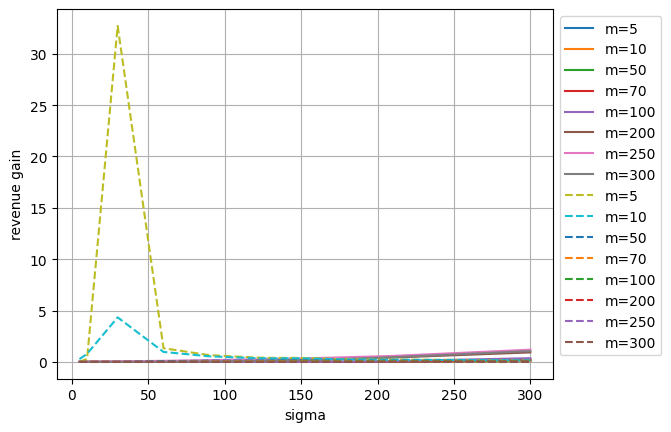

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]

for mean_idx in range(len(means)):
  print("mean:", means[mean_idx])
  print("nulling_all_means_cap_sharing[mean_idx]", nulling_all_means_cap_sharing[mean_idx])
  print("nulling_all_means_nocap_sharing[mean_idx]", nulling_all_means_nocap_sharing[mean_idx])
  # gains = [nulling_all_means_cap_sharing[mean_idx][i]/nulling_all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [(nulling_all_means_cap_sharing[mean_idx][i] - nulling_all_means_nocap_sharing[mean_idx][i])/abs(nulling_all_means_nocap_sharing[mean_idx][i]) for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")

print("---")
for mean_idx in range(len(means)):
  print("mean:", means[mean_idx])
  print("no_nulling_all_means_cap_sharing[mean_idx]", no_nulling_all_means_cap_sharing[mean_idx])
  print("no_nulling_all_means_nocap_sharing[mean_idx]", no_nulling_all_means_nocap_sharing[mean_idx])
  # gains = [no_nulling_all_means_cap_sharing[mean_idx][i]/no_nulling_all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [(no_nulling_all_means_cap_sharing[mean_idx][i]-no_nulling_all_means_nocap_sharing[mean_idx][i])/abs(no_nulling_all_means_nocap_sharing[mean_idx][i]) for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}", linestyle='--')

# plt.yscale("log")
plt.xlabel("sigma")
plt.ylabel("revenue gain")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid()
plt.show()






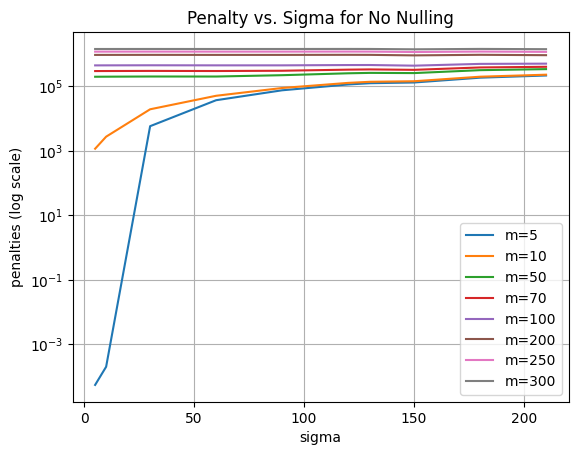

In [ ]:
for mean_idx in range(len(means)):
  gains = [no_nulling_all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")


plt.xlabel("sigma")
plt.ylabel("penalties (log scale)")
plt.title("Penalty vs. Sigma for No Nulling")
plt.yscale("log")
plt.legend()
plt.grid()
plt.show()

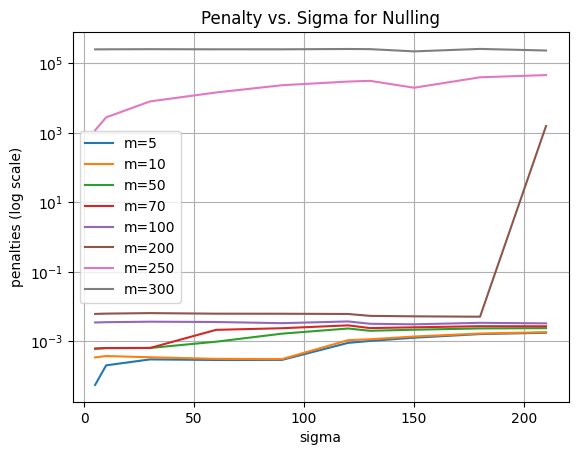

In [ ]:
for mean_idx in range(len(means)):
  gains = [nulling_all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")


plt.xlabel("sigma")
plt.ylabel("penalties (log scale)")
plt.title("Penalty vs. Sigma for Nulling")
plt.yscale("log")
plt.legend()
plt.grid()
plt.show()

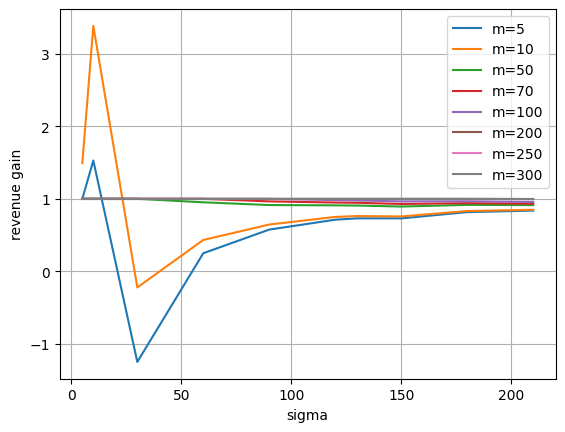

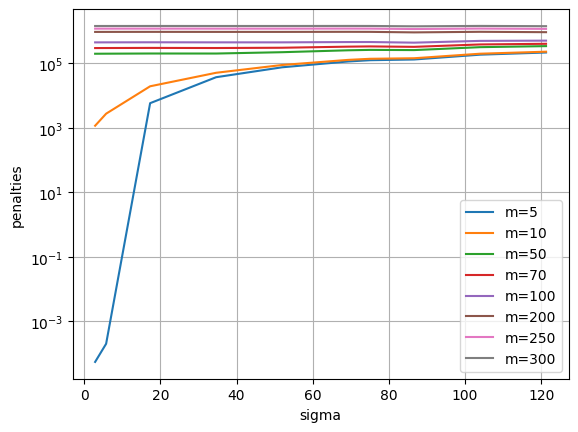

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")  `


# plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


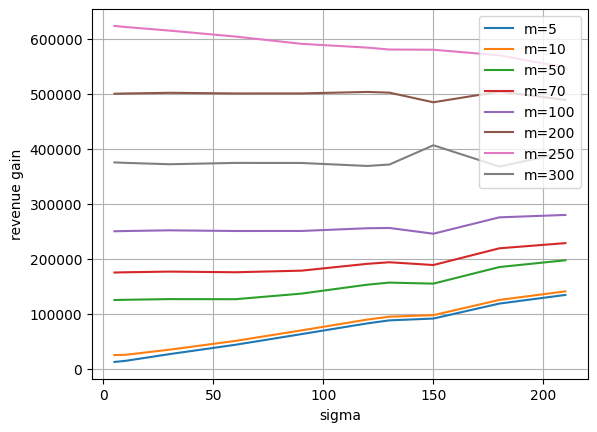

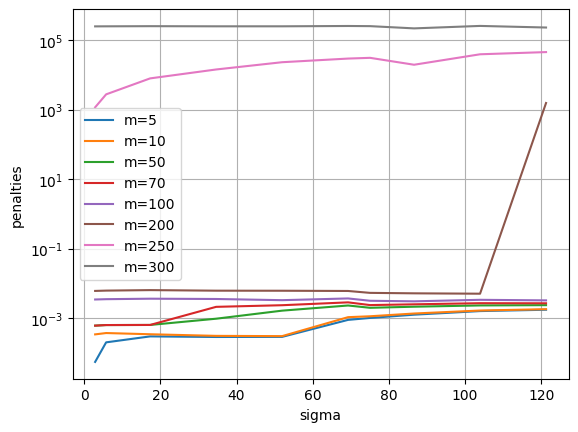

In [ ]:
# plot revenues
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  # gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  gains = [all_means_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  # gains = [np.log10(gain) for gain in gains]
  plt.plot(spreads, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")


# plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.yscale("log")
plt.legend()
plt.grid()
plt.show()


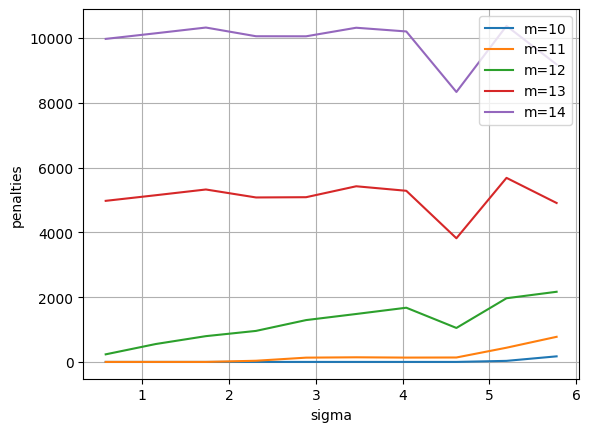

In [ ]:
# plot penalties
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_penalties_cap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("penalties")

plt.legend()
plt.grid()

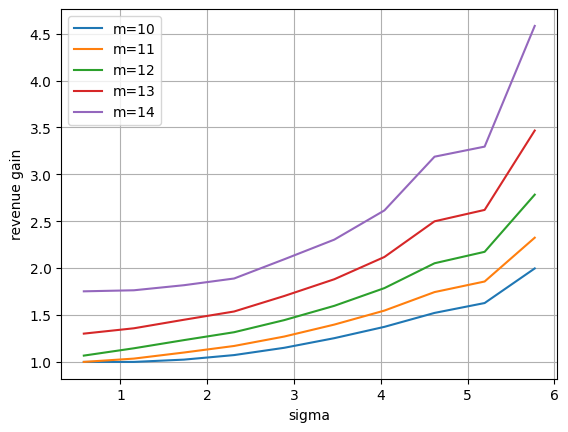

In [ ]:
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")



plt.legend()
plt.grid()

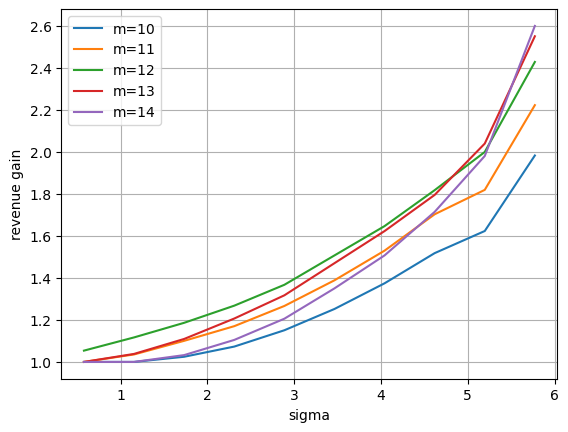

In [ ]:
sigmas = [spread*2/(12**0.5) for spread in spreads]
for mean_idx in range(len(means)):
  gains = [all_means_cap_sharing[mean_idx][i]/all_means_nocap_sharing[mean_idx][i] for i in range(len(means_with_sharing))]
  plt.plot(sigmas, gains, label=f"m={means[mean_idx]}")
  plt.xlabel("sigma")
  plt.ylabel("revenue gain")



plt.legend()
plt.grid()



In [ ]:
 # CHANGE ME: Parameters
N = 25  # Number of satellites/regions
C = 10    # Capacity of each satellite
r = 100  # Revenue per unit of satisfied demand
alpha = 200 # Penalty per unit of unsatisfied demand
beta = 1  # Cost multiplier for sharing capacity
random.seed(0)  # For reproducibility



# spreads = [1,2,3,4,5,6,7,8,9,10]
# spreads = [10,20,30,40,50,60,70,80,90,100]
means_without_sharing = []
for spread_idx in range(len(spreads)):

  revenues = []
  penalties = []
  profits = []

  for trial_idx in range(trials):
    demand = demand_matrix[spread_idx, trial_idx]
    # print("demand", demand)
    # Problem 1
    # result = with_capacity_sharing_and_share_cost(verbose=False, plot=True) # CHANGE ME
    # Problem 2
    # result = with_capacity_sharing(verbose=False, plot=False, demand=demand) # CHANGE ME
    # Problem 3
    result = no_capacity_sharing(verbose=False, plot=False, demand=demand) # CHANGE ME
    revenues.append(result["revenue"])
    penalties.append(result["penalty"])
    profits.append(result["profit"])

  # Calculate mean and standard deviation
  mean = np.mean(profits)
  std_dev = np.std(profits)

  means_without_sharing.append(mean)

  # # Plot the histogram
  # plt.figure(figsize=(8, 6))
  # plt.hist(penalties, bins=10, alpha=0.7, edgecolor='black', label='Data distribution')

  # # Add lines for mean and standard deviation
  # plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
  # plt.axvline(mean - std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'-1 SD: {mean - std_dev:.2f}')
  # plt.axvline(mean + std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'+1 SD: {mean + std_dev:.2f}')

  # # Add labels and title
  # plt.title(f'Distribution of Penalties with Mean={round(mean,3)} and Std. Dev.={round(std_dev,3)}, N={N}')
  # plt.xlabel('Value')
  # plt.ylabel('Frequency')
  # plt.legend()
  # plt.grid(alpha=0.3)
  # plt.show()

  # # Calculate mean and standard deviation
  # mean = np.mean(profits)
  # std_dev = np.std(profits)

  # # Plot the histogram
  # plt.figure(figsize=(8, 6))
  # plt.hist(profits, bins=10, alpha=0.7, edgecolor='black', label='Data distribution')

  # # Add lines for mean and standard deviation
  # plt.axvline(mean, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mean:.2f}')
  # plt.axvline(mean - std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'-1 SD: {mean - std_dev:.2f}')
  # plt.axvline(mean + std_dev, color='blue', linestyle='dotted', linewidth=2, label=f'+1 SD: {mean + std_dev:.2f}')

  # # Add labels and title
  # plt.title(f'Distribution of Profits with Mean={round(mean,3)} and Std. Dev.={round(std_dev,3)}, N={N}')
  # plt.xlabel('Value')
  # plt.ylabel('Frequency')
  # plt.legend()
  # plt.grid(alpha=0.3)
  # plt.show()


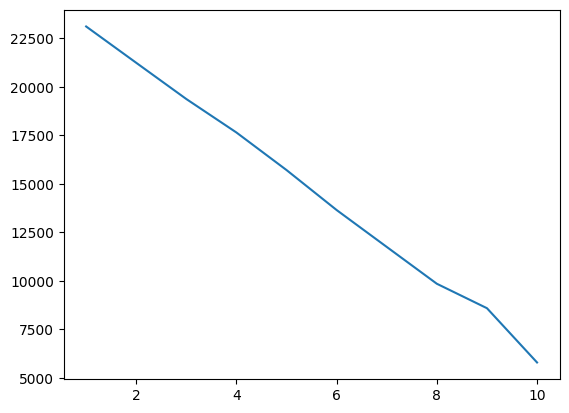

In [ ]:
plt.plot(spreads, means_without_sharing)

[1.0809624175581973,
 1.1750192567329854,
 1.2920236853442986,
 1.4324559726890482,
 1.600612411143589,
 1.8261290290756542,
 2.091913606985543,
 2.511264277372042,
 3.0748130962138736,
 4.031006495511688]

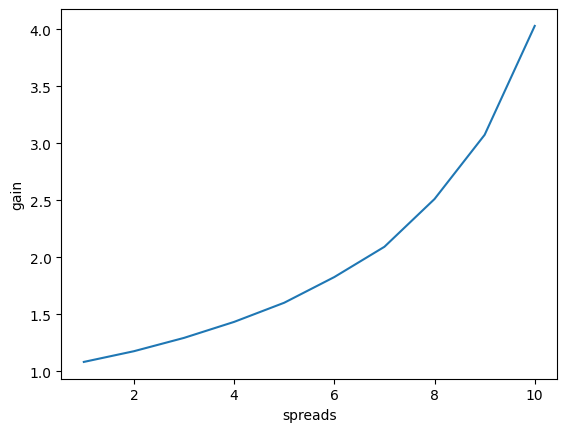

In [ ]:
gains = [means_with_sharing[i]/means_without_sharing[i] for i in range(len(means_with_sharing))]
gains

plt.plot(spreads, gains)
plt.xlabel("spreads")
plt.ylabel("gain")
gains